In [ ]:
import cv2, os

data_path = r"datasets"
categories = os.listdir(data_path)
labels = [i for i in range(len(categories))]
label_dict = dict(zip(categories, labels))

print(categories)
print(labels)
print(label_dict)

['with_mask', 'without_mask', '.ipynb_checkpoints']
[0, 1, 2]
{'with_mask': 0, 'without_mask': 1, '.ipynb_checkpoints': 2}


In [ ]:
def get_image_path(folder_path):
    path = []
    img = os.listdir(folder_path)
    for i in img:
        img_loc = i.split("._")
        if len(img_loc) > 1:
            pass
        else:
            path.append(img_loc[len(img_loc) - 1])
    return path


In [ ]:
img_size = 100
data = []
target = []

for category in categories:
    folder_path = os.path.join(data_path, category)
    img_names = get_image_path(folder_path)
    print(folder_path)
    print(len(img_names))
    
    for img_name in img_names:
        img_path = os.path.join(folder_path, img_name)
        img = cv2.imread(img_path)
        
        try:
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            resized = cv2.resize(gray, (100, 100))
            data.append(resized)
            target.append(label_dict[category])
        except Exception as e:
            print(f'Exception: {e}')
            
print(f'Target length: {len(target)}')
print(f'Data Lenght: {len(data)}')

datasets/with_mask
690
datasets/without_mask
686
datasets/.ipynb_checkpoints
0
Target length: 1376
Data Lenght: 1376


In [ ]:
import numpy as np
from keras.utils import to_categorical

data = np.array(data)/255.0
data = np.reshape(data, (data.shape[0], 100, 100, 1))

target = np.array(target)
new_target = to_categorical(target)

In [ ]:
new_target.shape

(1376, 2)

In [ ]:
np.save('data', data)
np.save('target', new_target)

In [ ]:
import numpy as np

data = np.load('data.npy')
target = np.load('target.npy')

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, Dense, Flatten, MaxPooling2D, Dropout
from keras.callbacks import ModelCheckpoint

model = Sequential()

model.add(Conv2D(200, (3, 3), activation = "relu", input_shape = data.shape[1:]))
model.add(MaxPooling2D(pool_size = (2, 2)))

model.add(Conv2D(100, (3 ,3), activation = "relu", ))
model.add(MaxPooling2D(pool_size = (2, 2)))

model.add(Flatten())
model.add(Dropout(0.5))

model.add(Dense(50, activation = "relu"))
model.add(Dense(2, activation = "softmax"))

model.compile(loss = "categorical_crossentropy", optimizer = "adam", metrics = ['accuracy'])

In [ ]:
target.shape

(1376, 2)

In [ ]:
from sklearn.model_selection import train_test_split

train_data, test_data, train_target, test_target = train_test_split(data, target, test_size = 0.1)

In [ ]:
model.fit(train_data, train_target, epochs = 20, validation_split = 0.2)

Epoch 1/20
31/31 [==============================] - 80s 3s/step - loss: 0.7100 - accuracy: 0.5394 - val_loss: 0.6864 - val_accuracy: 0.5121
Epoch 2/20
31/31 [==============================] - 79s 3s/step - loss: 0.6425 - accuracy: 0.6071 - val_loss: 0.5340 - val_accuracy: 0.7581
Epoch 3/20
31/31 [==============================] - 78s 3s/step - loss: 0.4884 - accuracy: 0.7909 - val_loss: 0.3782 - val_accuracy: 0.8831
Epoch 4/20
31/31 [==============================] - 78s 3s/step - loss: 0.3098 - accuracy: 0.8707 - val_loss: 0.1839 - val_accuracy: 0.9234
Epoch 5/20
31/31 [==============================] - 84s 3s/step - loss: 0.2630 - accuracy: 0.8960 - val_loss: 0.1900 - val_accuracy: 0.9274
Epoch 6/20
31/31 [==============================] - 77s 2s/step - loss: 0.2079 - accuracy: 0.9232 - val_loss: 0.1687 - val_accuracy: 0.9395
Epoch 7/20
31/31 [==============================] - 77s 2s/step - loss: 0.1545 - accuracy: 0.9485 - val_loss: 0.1610 - val_accuracy: 0.9476
Epoch 8/20
31/31 [==

In [ ]:
model.save('mask_detector')

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: mask_detector/assets


In [ ]:
from tensorflow import keras
model = keras.models.load_model('mask_detector')
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 98, 98, 200)       2000      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 49, 49, 200)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 47, 47, 100)       180100    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 23, 23, 100)       0         
_________________________________________________________________
flatten (Flatten)            (None, 52900)             0         
_________________________________________________________________
dropout (Dropout)            (None, 52900)             0         
_________________________________________________________________
dense (Dense)                (None, 50)                2

In [ ]:
print(model.evaluate(test_data, test_target))

5/5 [==============================] - 2s 484ms/step - loss: 0.0943 - accuracy: 0.9710
[0.09433572739362717, 0.9710144996643066]


In [ ]:
from keras.models import load_model
import numpy as np

face_cascader = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

labels_dict = {0: "WITH MASK", 1: "WITHOUT MASK"}
colors_dict = {0: (0, 255, 0), 1: (0, 0, 255)}

[[0.02284745 0.9771525 ]]
1
[[0.03212793 0.967872  ]]
1
[[0.02008148 0.9799185 ]]
1


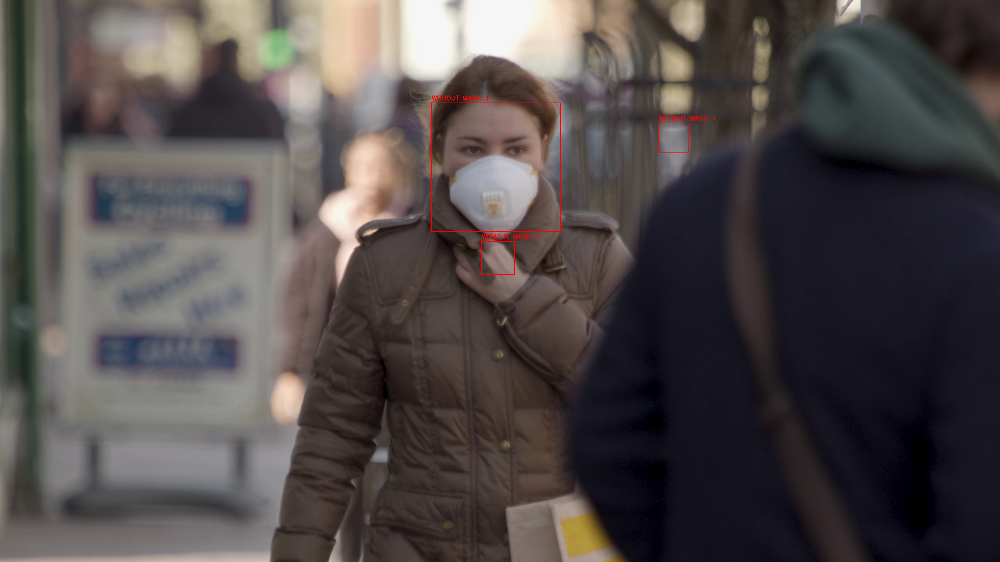

[[0.02192998 0.97806996]]
1
[[0.02275778 0.97724223]]
1


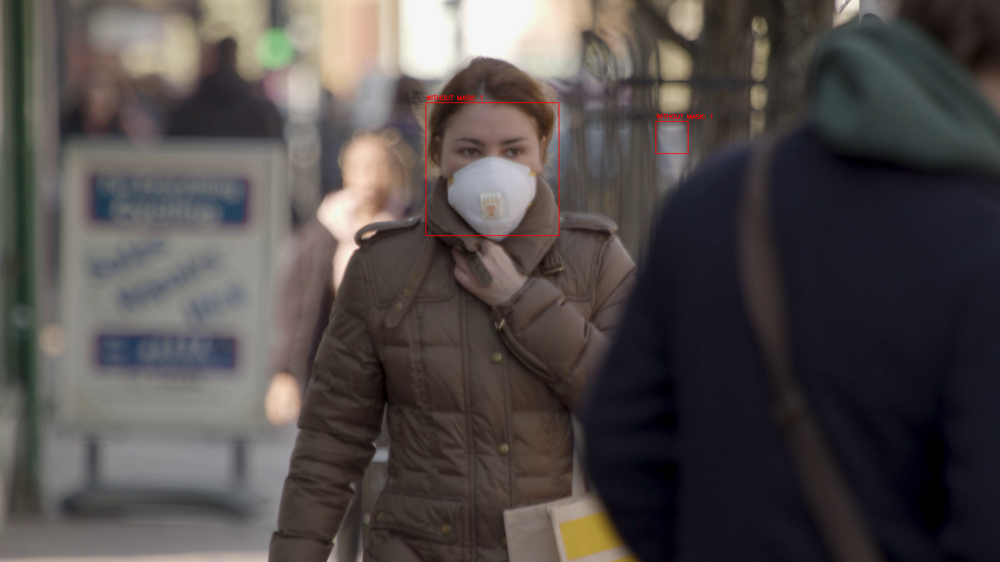

[[0.01993764 0.9800624 ]]
1
[[0.02347244 0.9765276 ]]
1
[[0.03483419 0.9651658 ]]
1
[[0.02184927 0.9781507 ]]
1


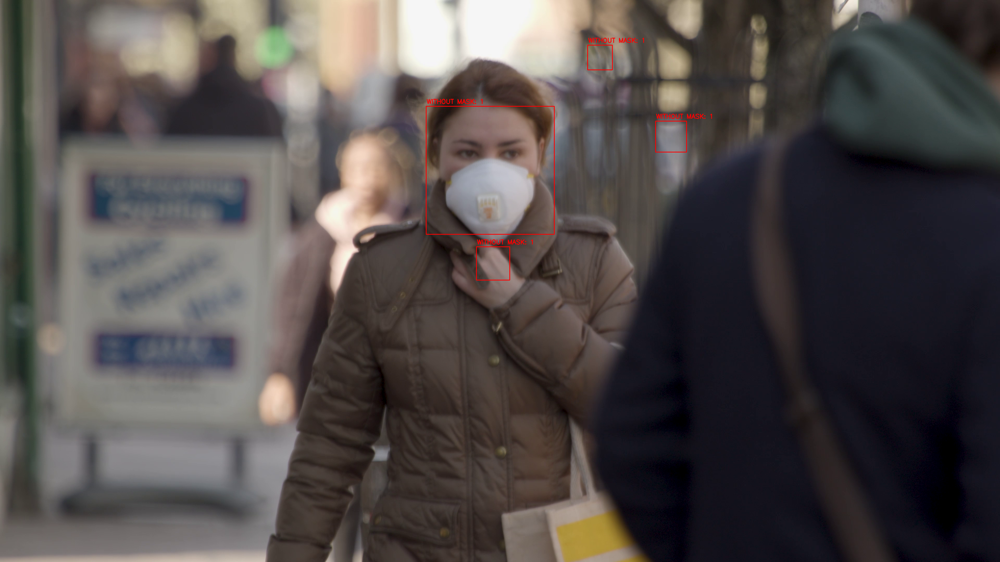

[[0.01982275 0.9801773 ]]
1
[[0.0239916 0.9760084]]
1
[[0.02104303 0.978957  ]]
1
[[0.02405892 0.9759411 ]]
1
[[0.01293511 0.98706484]]
1


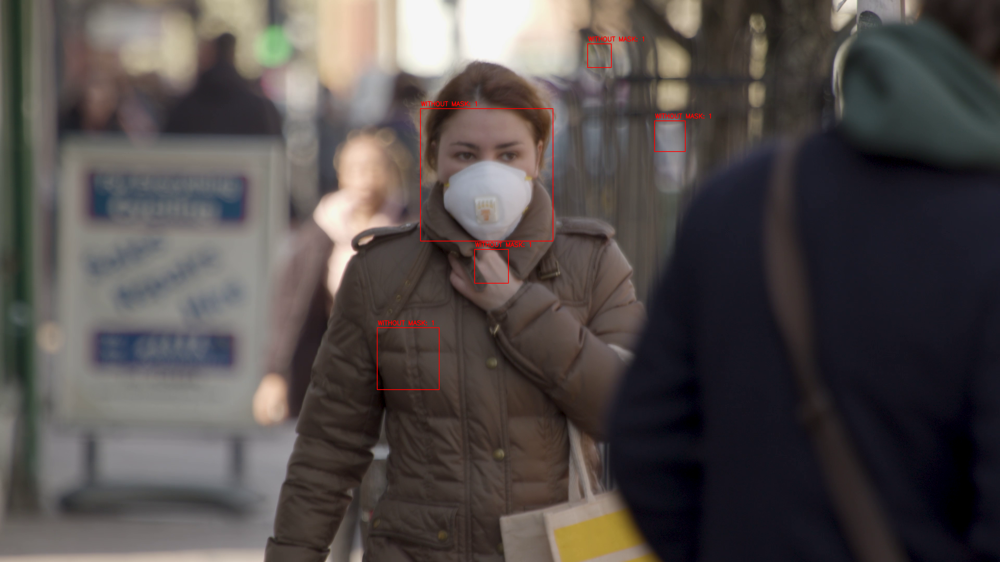

In [ ]:
from google.colab.patches import cv2_imshow
cap = cv2.VideoCapture("/content/datasets/200323 - Coronavirus_01_4k_014.mp4")
#cap = cv2.VideoCapture("/content/datasets/aa.jpg")


while(True):
    _, img = cap.read()
    gray_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascader.detectMultiScale(gray_image)

    for (x, y, w, h) in faces:
        face_img = gray_image[y: y+w, x: x+w]
        resized = cv2.resize(face_img, (100, 100))
        normalized = resized/255
        reshaped = np.reshape(normalized, (1, 100, 100, 1))
        result = model.predict(reshaped)
        print(result)

        label = np.argmax(result, axis=1)[0]
        print(label)
        text = labels_dict[label] + ": " + str(label)
        
        cv2.rectangle(img, (x, y), (x+w, y+h), colors_dict[label], 2)
        cv2.putText(img, text, (x+2, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, colors_dict[label], 2)
        
    cv2_imshow(img)
    key = cv2.waitKey(1)
    
    if key == 27:
        break
cv2.destroyAllWindows()
cap.release()